# Beaufort Gyre isopycnal data

In [2]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.path as mpath
plt.rcParams['text.usetex'] = False
plt.rcParams['mathtext.fontset'] = 'dejavuserif'
plt.rcParams['font.family'] = 'Dejavu Serif'
plt.rcParams['font.size'] = 12
import netCDF4 as nc
import scipy as sp
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LongitudeFormatter, LatitudeFormatter
import inspect

In [3]:
# some constants
nx        = 500  # number of cells
ny        = 500  # ""
nz        = 50   # ""
dx        = 2000  # cell size in meters
dy        = 2000  # ""
rhoConst  = 1029. # ref density
s0        = 33    # ref salinity
g         = 9.81
tAlpha    = 0
sBeta     = 7.4e-4
f0        = 1.4e-4
hDegLat   = 111000./2    # 0.5deg latitude in meters
hDegLon   = hDegLat * np.cos(2*np.pi*75/360) # 0.5deg lon in meters @ 75N
pdelta    = 4.4e-10   # pressure parameter for linear equation of state

### Change SW corner loc & domain size here
- corresponding lat & lon printed a few boxes below

In [4]:
# indices for profile location
# gives southwest corner of domain

# dont change dVI
dVI = -8              # deepValueIndex
myLat = 315           #  +1 index gives +0.5 deg
myLon = 20            #  +1 index gives -0.5 deg

# size of domain (index range!)
latRange = 35
lonRange = 120



### Change months to average here
- integers between 1 and 12, inclusive

In [5]:
# file i/o stuff
locLoad = '/home/hcm7920/data/'
monthList = [1,2,3,4,5,6,7,8,9,10,11,12]            # jan=1, dec=12
fname1 = "OCEAN_DENS_STRAT_PRESS_mon_mean_2017-"
fnameV = "OCEAN_VELOCITY_mon_mean_2017-"
fname2 = "_ECCO_V4r4_latlon_0p50deg.nc"

In [6]:
# load data for selected months & time average
lats  = nc.Dataset(locLoad+fname1+f"01"+fname2)["latitude"][myLat:myLat+latRange]
lons  = nc.Dataset(locLoad+fname1+f"01"+fname2)["longitude"][myLon:myLon+lonRange]
depth = nc.Dataset(locLoad+fname1+f"01"+fname2)["Z"][:dVI]
numLevels, = depth.shape
dataArray  = np.ma.zeros(shape=(len(monthList),numLevels,latRange,lonRange))
dataArray2 = np.ma.zeros(shape=(len(monthList),numLevels,latRange,lonRange))
for month in range(len(monthList)):
    dataArray[month,:,:,:]  = nc.Dataset(locLoad+fname1+f"{month+1:02}"+fname2
                                     )["RHOAnoma"][0,:dVI,myLat:myLat+latRange,myLon:myLon+lonRange]
    dataArray2[month,:,:,:] = nc.Dataset(locLoad+fname1+f"{month+1:02}"+fname2
                                     )["DRHODR"][0,:dVI,myLat:myLat+latRange,myLon:myLon+lonRange]
numLevels = dataArray.shape[1]
dataArray.fill_value=np.nan
dataArray2.fill_value=np.nan

densities = dataArray.mean(0)
nSquare   = dataArray2.mean(0) * g / rhoConst

del dataArray

In [7]:
# load data for selected months & time average
latsV  = nc.Dataset(locLoad+fnameV+f"01"+fname2)["latitude"][myLat:myLat+latRange]
lonsV  = nc.Dataset(locLoad+fnameV+f"01"+fname2)["longitude"][myLon:myLon+lonRange]
depthV = nc.Dataset(locLoad+fnameV+f"01"+fname2)["Z"][:dVI]
numLevels, = depth.shape
dataArray1 = np.ma.zeros(shape=(len(monthList),numLevels,latRange,lonRange))
dataArray2 = np.ma.zeros(shape=(len(monthList),numLevels,latRange,lonRange))
for month in range(len(monthList)):
    dataArray1[month,:,:,:] = nc.Dataset(locLoad+fnameV+f"{month+1:02}"+fname2
                                     )["NVEL"][0,:dVI,myLat:myLat+latRange,myLon:myLon+lonRange]
    dataArray2[month,:,:,:] = nc.Dataset(locLoad+fnameV+f"{month+1:02}"+fname2
                                     )["EVEL"][0,:dVI,myLat:myLat+latRange,myLon:myLon+lonRange]

numLevels = dataArray1.shape[1]
dataArray1.fill_value=np.nan
dataArray2.fill_value=np.nan

nVel = dataArray1.mean(0)
eVel = dataArray2.mean(0)

del dataArray1
del dataArray2


In [8]:
# generate initial hydrostatic pressure field
pressure = np.zeros((nz+dVI,latRange,lonRange))
for i in range(50+dVI):
  pressure[i,:,:] = g * (rhoConst) * -depth[i]

# convert base density profile to potential density
densities = rhoConst + densities - rhoConst * pressure * pdelta


## Calculate QG potential vorticity terms

In [9]:
def coriolisParam(latitude):
    return 2*7.2921e-5*np.sin(2*np.pi*latitude/360)

def hDegLonFunc(latitude):
    return hDegLat * np.cos(2*np.pi*latitude/360)

hDegLon = np.zeros(shape=lats.shape)
coriolis = np.zeros(shape=lats.shape)

for index in range(lats.shape[0]):
    hDegLon[index]  = hDegLonFunc(lats[index])
    coriolis[index] = coriolisParam(lats[index])

In [10]:
meanCurl  = (nVel[:,1:-1,2:]-nVel[:,1:-1,:-2]) / (2*hDegLon[np.newaxis,1:-1,np.newaxis])
meanCurl -= (eVel[:,2:,1:-1] - eVel[:,:-2,1:-1]) / (2*hDegLat)
meanCurl = (meanCurl[1:,:,:]+meanCurl[:-1,:,:])/2

In [11]:
meanB = -(densities[:,1:-1,1:-1]-rhoConst)*g/rhoConst
meanBfn = meanB * coriolis[np.newaxis,1:-1,np.newaxis] / nSquare[:,1:-1,1:-1]
Gamma = (meanBfn[:-1,:,:]-meanBfn[1:,:,:])/(depth[:-1]-depth[1:])[:,np.newaxis,np.newaxis]

In [12]:
halfDepths = 0.5*(depth[:-1] + depth[1:])
newlats = lats[1:-1]
newlons = lons[1:-1]
planetVort = (np.ones(shape=Gamma.shape)*coriolis[np.newaxis,1:-1,np.newaxis])

In [13]:
# save gamma profile for other figure
# 78 to 81 north; 150 to 135 west
# lat index from 19 to 27
# lon index from 38 to 70

print(newlats[19:27],'\nn',
      newlons[38:70])

loc4 = "/home/hcm7920/experiments/arcticMiddepthBI/analysis/figData/"
meanGamma = Gamma.mean((1,2))
np.save(loc4 + "meanGamma", meanGamma.filled())
np.save(loc4 + "dpthGamma", halfDepths.filled())

[77.75 78.25 78.75 79.25 79.75 80.25 80.75 81.25] 
n [-150.25 -149.75 -149.25 -148.75 -148.25 -147.75 -147.25 -146.75 -146.25
 -145.75 -145.25 -144.75 -144.25 -143.75 -143.25 -142.75 -142.25 -141.75
 -141.25 -140.75 -140.25 -139.75 -139.25 -138.75 -138.25 -137.75 -137.25
 -136.75 -136.25 -135.75 -135.25 -134.75]


## Plot individual terms

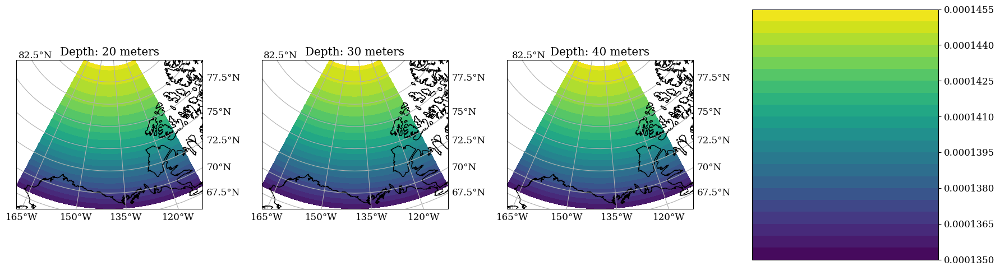

In [14]:
# coriolis
fig      = plt.figure(figsize=(18,5))
interval = 1
counter  = 1
for index in range(3):    
    axs = plt.subplot(1,4,(1+index),
                      projection=ccrs.AzimuthalEquidistant(
                      central_longitude=-140,central_latitude=75))
    im = axs.contourf(newlons,newlats,planetVort[counter,:,:],20,
                      transform=ccrs.PlateCarree())
    axs.set_title(f"Depth: {-int(halfDepths[counter])} meters")
    axs.set_ylabel("Latitude")
    axs.set_xlabel("Longitude")
    axs.coastlines(resolution="10m")
    gl = axs.gridlines(draw_labels=True,rotate_labels=False)
    gl.xlocator = mticker.FixedLocator([-165,-150,-135,-120])
    gl.top_labels = False
    gl.left_labels= False
    axs.xaxis.set_major_formatter(LongitudeFormatter(dateline_direction_label=False))
    axs.yaxis.set_major_formatter(LatitudeFormatter())
    counter += interval
axs = plt.subplot(1,4,4)
plt.colorbar(im,cax=axs)
plt.tight_layout()


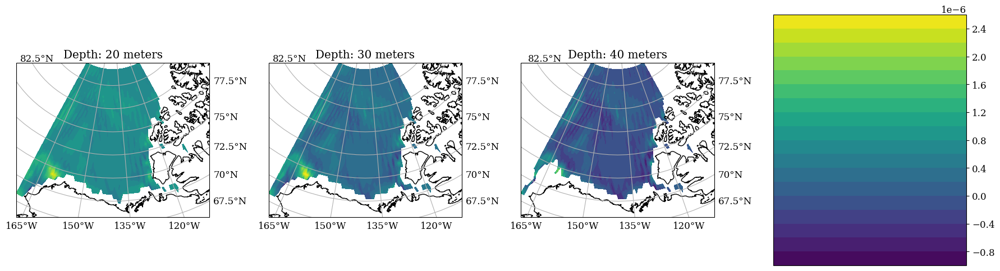

In [15]:
# mean curl
fig      = plt.figure(figsize=(18,5))
interval = 1
counter  = 1
for index in range(3):    
    axs = plt.subplot(1,4,(1+index),
                      projection=ccrs.AzimuthalEquidistant(
                      central_longitude=-140,central_latitude=75))
    im = axs.contourf(newlons,newlats,meanCurl[counter,:,:],20,
                      transform=ccrs.PlateCarree())
    axs.set_title(f"Depth: {-int(halfDepths[counter])} meters")
    axs.set_ylabel("Latitude")
    axs.set_xlabel("Longitude")
    axs.coastlines(resolution="10m")
    gl = axs.gridlines(draw_labels=True,rotate_labels=False)
    gl.xlocator = mticker.FixedLocator([-165,-150,-135,-120])
    gl.top_labels = False
    gl.left_labels= False
    axs.xaxis.set_major_formatter(LongitudeFormatter(dateline_direction_label=False))
    axs.yaxis.set_major_formatter(LatitudeFormatter())
    counter += interval
axs = plt.subplot(1,4,4)
plt.colorbar(im,cax=axs)
plt.tight_layout()


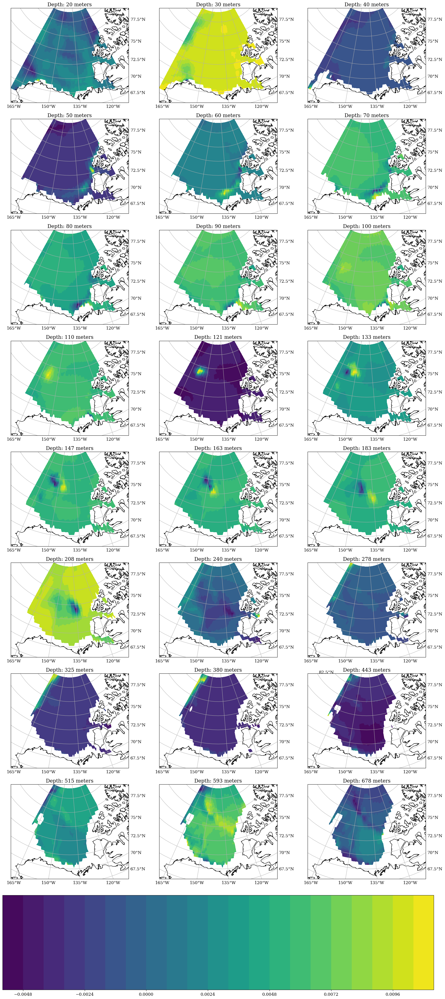

In [16]:
# gamma
fig      = plt.figure(figsize=(18,40))
interval = 1
counter  = 1
for index in range(24):    
    axs = plt.subplot(9,3,(1+index),
                      projection=ccrs.AzimuthalEquidistant(
                      central_longitude=-140,central_latitude=75))
    im = axs.contourf(newlons,newlats,Gamma[counter,:,:],20,
                      transform=ccrs.PlateCarree())
    axs.set_title(f"Depth: {-int(halfDepths[counter])} meters")
    axs.set_ylabel("Latitude")
    axs.set_xlabel("Longitude")
    axs.coastlines(resolution="10m")
    gl = axs.gridlines(draw_labels=True,rotate_labels=False)
    gl.xlocator = mticker.FixedLocator([-165,-150,-135,-120])
    gl.top_labels = False
    gl.left_labels= False
    axs.xaxis.set_major_formatter(LongitudeFormatter(dateline_direction_label=False))
    axs.yaxis.set_major_formatter(LatitudeFormatter())
    counter += interval
axs = plt.subplot(9,1,9)
plt.colorbar(im,cax=axs,orientation='horizontal')
plt.tight_layout()


## Plot QGPV

In [17]:

QGPV = planetVort + meanCurl + Gamma

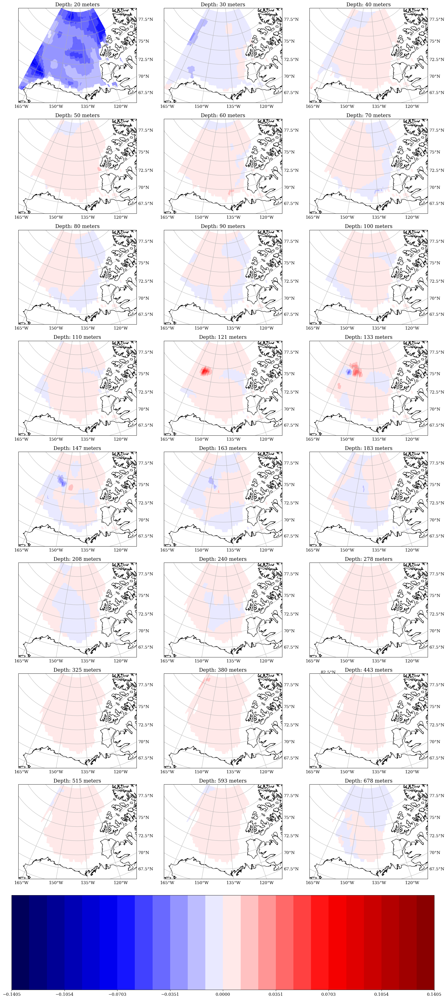

In [18]:
# qgpv
fig      = plt.figure(figsize=(18,40))
interval = 1
counter  = 1
myMax = np.max(abs(QGPV))
levs = np.linspace(-myMax,myMax,25)
for index in range(24):    
    axs = plt.subplot(9,3,(1+index),
                      projection=ccrs.AzimuthalEquidistant(
                      central_longitude=-140,central_latitude=75))
    im = axs.contourf(newlons,newlats,QGPV[counter,:,:],levs,
                      cmap='seismic',transform=ccrs.PlateCarree())
    axs.set_title(f"Depth: {-int(halfDepths[counter])} meters")
    axs.set_ylabel("Latitude")
    axs.set_xlabel("Longitude")
    axs.coastlines(resolution="10m")
    gl = axs.gridlines(draw_labels=True,rotate_labels=False)
    gl.xlocator = mticker.FixedLocator([-165,-150,-135,-120])
    gl.top_labels = False
    gl.left_labels= False
    axs.xaxis.set_major_formatter(LongitudeFormatter(dateline_direction_label=False))
    axs.yaxis.set_major_formatter(LatitudeFormatter())
    counter += interval
axs = plt.subplot(9,1,9)
plt.colorbar(im,cax=axs,orientation='horizontal')
plt.tight_layout()


## Calculate and plot merid gradient of QGPV

In [19]:
QGPVdy = (QGPV[:,1:,:]-QGPV[:,:-1,:])/hDegLat
newnewlats = (newlats[:-1]+newlats[1:])/2

GAMMAdy = (Gamma[:,1:,:]-Gamma[:,:-1,:])/hDegLat
meanGdy = GAMMAdy.mean((1,2))

In [20]:
# save gammaDy profile for other figure

loc4 = "/home/hcm7920/experiments/arcticMiddepthBI/analysis/figData/"
np.save(loc4 + "meanGdy", meanGdy.filled())
np.save(loc4 + "dpthGdy", halfDepths.filled())

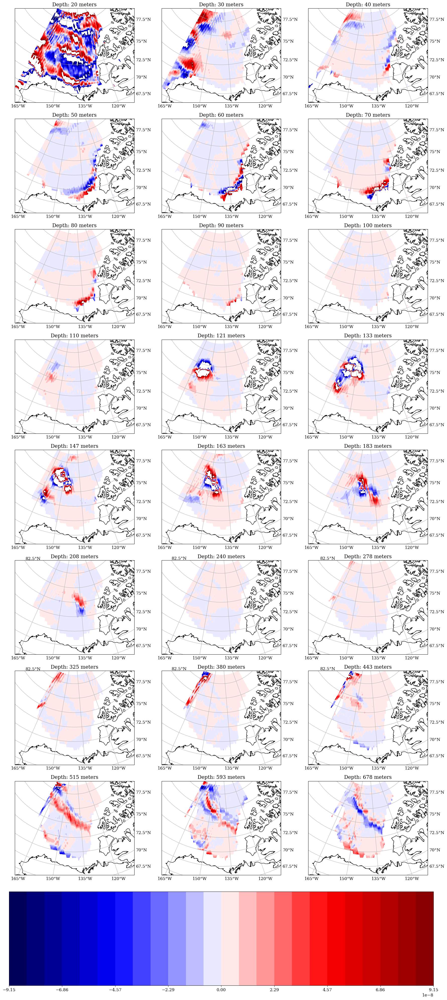

In [21]:
# merid grad of qgpv
fig      = plt.figure(figsize=(18,40))
interval = 1
counter  = 1
myMax = np.max(abs(QGPVdy))*0.1
levs = np.linspace(-myMax,myMax,25)
for index in range(24):    
    axs = plt.subplot(9,3,(1+index),
                      projection=ccrs.AzimuthalEquidistant(
                      central_longitude=-140,central_latitude=75))
    im = axs.contourf(newlons,newnewlats,QGPVdy[counter,:,:],levs,
                      cmap='seismic',transform=ccrs.PlateCarree())
    axs.set_title(f"Depth: {-int(halfDepths[counter])} meters")
    axs.set_ylabel("Latitude")
    axs.set_xlabel("Longitude")
    axs.coastlines(resolution="10m")
    gl = axs.gridlines(draw_labels=True,rotate_labels=False)
    gl.xlocator = mticker.FixedLocator([-165,-150,-135,-120])
    gl.top_labels = False
    gl.left_labels= False
    axs.xaxis.set_major_formatter(LongitudeFormatter(dateline_direction_label=False))
    axs.yaxis.set_major_formatter(LatitudeFormatter())
    counter += interval
axs = plt.subplot(9,1,9)
plt.colorbar(im,cax=axs,orientation='horizontal')
plt.tight_layout()


## Plot dQGPV dy sections

- put a sea ice plot on top of this graph
- put green flags that denote the boundary of the green box on the other figure

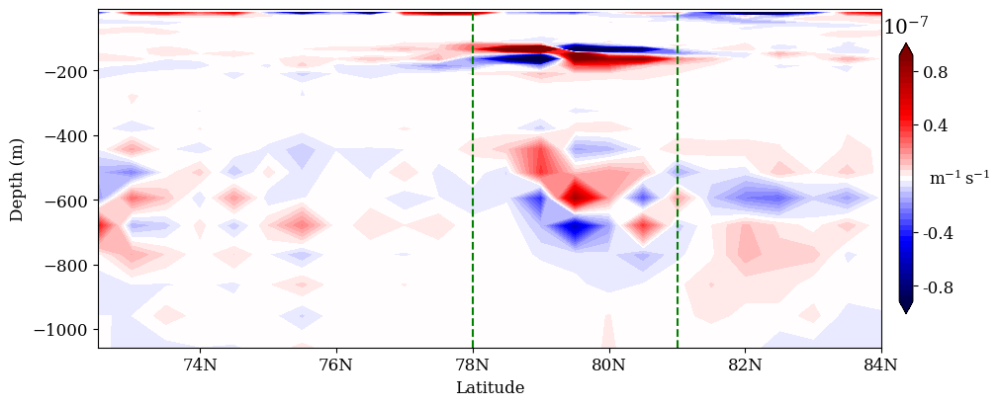

In [22]:
fig,axs  = plt.subplots(1,1,figsize=(10,4),layout='constrained')
maxD     = 29
counter  = 40
qyMaxCbar =  abs(QGPVdy).max()*1e-1*1e7
levs1 = np.linspace(-qyMaxCbar,qyMaxCbar,46)
im=axs.contourf(newnewlats[8:],halfDepths[:maxD],QGPVdy[:maxD,8:,counter]*1e7,levs1,cmap='seismic',extend='both')
axs.vlines([78,81],ymin=halfDepths[maxD-1],ymax=-10,colors='green',linestyles='dashed')

axs.xaxis.set_major_formatter(mticker.StrMethodFormatter("{x:.0f}N"))
axs.set_xlabel("Latitude")
axs.set_ylabel("Depth (m)")
cbar = plt.colorbar(im,pad=0,shrink=0.8,ticks=[-0.8,-0.4,0.4,0.8])
cbar.ax.set_title(r"${10}^{-7}$")
cbar.ax.set_yticklabels(["-0.8","-0.4","0.4","0.8"])
cbar.ax.set_ylabel("$\mathrm{m}^{-1}\,\mathrm{s}^{-1}$",rotation=0,
                  y=0.54)

plt.savefig("/home/hcm7920/experiments/arcticMiddepthBI/plots/officialFigs/figMeridPvGradBGSection.pdf")

In [23]:
print(newnewlats[8:])

[72.5 73.0 73.5 74.0 74.5 75.0 75.5 76.0 76.5 77.0 77.5 78.0 78.5 79.0
 79.5 80.0 80.5 81.0 81.5 82.0 82.5 83.0 83.5 84.0]


# Construct main figure
- consider adding another row to show 4 more depth levels

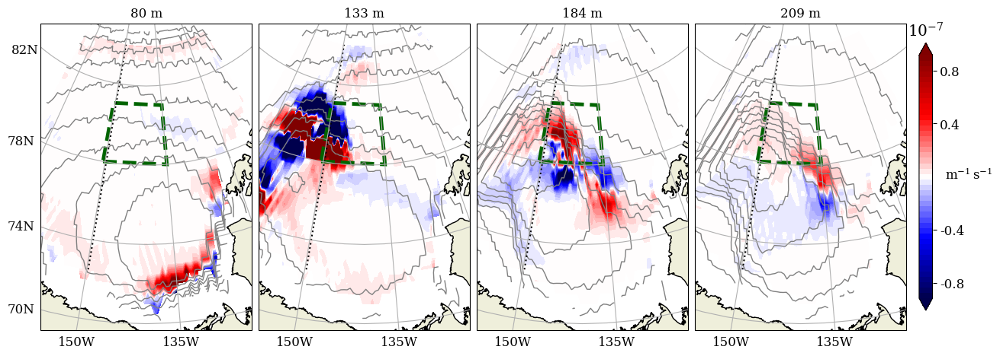

In [24]:
# main figure
dI = [7,12,15,16]
myProj = ccrs.AzimuthalEquidistant(central_longitude=-140,
                                   central_latitude=75)
qyMaxCbar =  abs(QGPVdy).max()*1e-1*1e7
levs1 = np.linspace(-qyMaxCbar,qyMaxCbar,46)
levs2 = np.linspace(1000,1040,400)

fig, axs = plt.subplots(1,4,sharey=True,layout='constrained',
                        subplot_kw=dict(projection=myProj),
                        figsize=(13,4.6))
for ix in range(len(dI)):
    
    im1 = axs[ix].contourf(newlons,newnewlats,QGPVdy[dI[ix],:,:]*1e7,levs1,
                          cmap='seismic',transform=ccrs.PlateCarree(),
                          extend='both')

    im2 = axs[ix].contour(lons,lats,densities[dI[ix],:,:],levs2,
                colors='grey',transform=ccrs.PlateCarree(),
                linewidths=1)
    
    im3 = axs[ix].vlines(-149.75,72.5,84,transform=ccrs.PlateCarree(),
                        colors='black',linestyles='dotted')
    
    rectangle = mpl.patches.Rectangle((-150.5,78), 15.5, 3, color="darkgreen",
                                  fc="none", linestyle="dashed", lw=3.5,
                                  transform=ccrs.PlateCarree())
    
    im4 = axs[ix].add_patch(rectangle)
    
    axs[ix].set_extent((-155,-125,69,85), crs=ccrs.PlateCarree())
    axs[ix].coastlines(resolution="10m")
    axs[ix].add_feature(cfeature.LAND)

    gl = axs[ix].gridlines(draw_labels=True,rotate_labels=False)
    gl.xlocator = mticker.FixedLocator([-165,-150,-135,-120])
    gl.ylocator = mticker.FixedLocator(np.array(range(66,85,4)))
    gl.xformatter = LongitudeFormatter(dateline_direction_label=False,degree_symbol='')
    gl.yformatter = LatitudeFormatter(degree_symbol='')
    gl.top_labels = False
    gl.right_labels= False
    if ix == 0:
        gl.left_labels = True
    else:
        gl.left_labels = False
    
    axs[ix].set_title(f"{-halfDepths[dI[ix]]:.0f} m", fontsize=12)

cbar = plt.colorbar(im1,ax=axs[-1],pad=0.06,shrink=0.8,ticks=[-0.8,-0.4,0.4,0.8])
cbar.ax.set_title(r"${10}^{-7}$")
cbar.ax.set_yticklabels(["-0.8","-0.4","0.4","0.8"])
cbar.ax.set_title(r"${10}^{-7}$")
cbar.ax.set_ylabel("$\mathrm{m}^{-1}\,\mathrm{s}^{-1}$",rotation=0,y=0.54)

plt.savefig("/home/hcm7920/experiments/arcticMiddepthBI/plots/officialFigs/figMeridPvGradBG.pdf")

In [25]:
# from lat lon to km
meridDistance  = np.linspace(hDegLat/2,hDegLat*latRange+hDegLat/2,latRange)
zonalDistance  = np.linspace(hDegLon/2,hDegLon*lonRange+hDegLon/2,lonRange)
meridDistance *= 1e-3 # convert to km
zonalDistance *= 1e-3 # convert to km